In [1]:
import pandas as pd
import seaborn as sbs
import numpy as np
import re

In [2]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

In [3]:
head = ['b', 't', 'e', 'm']

In [ ]:
dtaset = pd.read_csv('./data/2pageSessions.csv', header=head, encoding='utf-8')

In [3]:
df = pd.read_csv('../data/uci_news_aggregator.csv')
pd.set_option('display.max_columns', None)

In [12]:
df.columns

Index(['ID', 'TITLE', 'URL', 'PUBLISHER', 'CATEGORY', 'STORY', 'HOSTNAME',
       'TIMESTAMP'],
      dtype='object')

In [26]:
df

,ID,TITLE,URL,PUBLISHER,CATEGORY,STORY,HOSTNAME,TIMESTAMP
0,1,"Fed official says weak data caused by weather,...",http://www.latimes.com/business/money/la-fi-mo...,Los Angeles Times,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.latimes.com,1394470370698
1,2,Fed's Charles Plosser sees high bar for change...,http://www.livemint.com/Politics/H2EvwJSK2VE6O...,Livemint,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.livemint.com,1394470371207
2,3,US open: Stocks fall after Fed official hints ...,http://www.ifamagazine.com/news/us-open-stocks...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371550
3,4,"Fed risks falling 'behind the curve', Charles ...",http://www.ifamagazine.com/news/fed-risks-fall...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371793
4,5,Fed's Plosser: Nasty Weather Has Curbed Job Gr...,http://www.moneynews.com/Economy/federal-reser...,Moneynews,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.moneynews.com,1394470372027
...,...,...,...,...,...,...,...,...
422414,422933,Surgeons to remove 4-year-old's rib to rebuild...,http://www.cbs3springfield.com/story/26378648/...,WSHM-TV,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.cbs3springfield.com,1409229190251
422415,422934,Boy to have surgery on esophagus after battery...,http://www.wlwt.com/news/boy-to-have-surgery-o...,WLWT Cincinnati,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.wlwt.com,1409229190508
422416,422935,Child who swallowed battery to have reconstruc...,http://www.newsnet5.com/news/local-news/child-...,NewsNet5.com,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.newsnet5.com,1409229190771
422417,422936,Phoenix boy undergoes surgery to repair throat...,http://www.wfsb.com/story/26368078/phoenix-boy...,WFSB,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.wfsb.com,1409229191071


In [7]:
df['b'].count()

422420

In [4]:
ds = df[['TITLE','CATEGORY']]
ds.head(10)

,TITLE,CATEGORY
0,"Fed official says weak data caused by weather,...",b
1,Fed's Charles Plosser sees high bar for change...,b
2,US open: Stocks fall after Fed official hints ...,b
3,"Fed risks falling 'behind the curve', Charles ...",b
4,Fed's Plosser: Nasty Weather Has Curbed Job Gr...,b
5,Plosser: Fed May Have to Accelerate Tapering Pace,b
6,Fed's Plosser: Taper pace may be too slow,b
7,Fed's Plosser expects US unemployment to fall ...,b
8,US jobs growth last month hit by weather:Fed P...,b
9,ECB unlikely to end sterilisation of SMP purch...,b


<Axes: xlabel='CATEGORY', ylabel='count'>

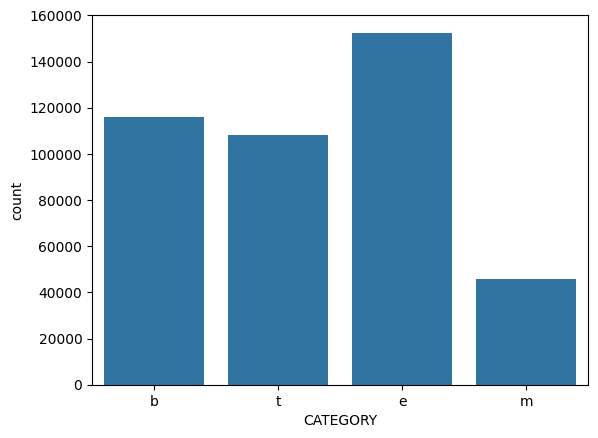

In [30]:
sbs.countplot(x='CATEGORY', data=ds)

In [ ]:
import tensorflow as tf

In [5]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/reaksa/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [6]:
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

In [7]:
cleaned = []
for i in range(0,len(ds)):
    
    #removing any other words than (a-z) and (A-Z)
    msg = re.sub('[^a-zA-Z]',' ',  ds['TITLE'][i])
    
    #converting all texts to lower case
    msg = msg.lower()
    
    #tokenizing
    msg = msg.split()
    
    #stemming and removing stopwords
    ps = PorterStemmer()
    msg = [ps.stem(words) for words in msg if not words in set(stopwords.words('english'))]
    msg = ' '.join(msg)
    cleaned.append(msg)

In [9]:
x = np.array(cleaned)
x.shape

(422419,)

In [10]:
cont_text = CountVectorizer()
wm =  cont_text.fit_transform(x)
doc_names = ['Doc{:d}'.format(idx) for idx, _ in enumerate(wm)]


In [11]:
feat_names = cont_text.get_feature_names_out()
feat_names

array(['aa', 'aaa', 'aaaarrrrrghhh', ..., 'zz', 'zzazz', 'zzzzz'],
      dtype=object)

In [12]:
sample_df = pd.DataFrame(data=wm.toarray(), index=doc_names,columns=feat_names)

In [13]:
sample_df

,aa,aaa,aaaarrrrrghhh,aaah,aacc,aaco,aacr,aafa,aafter,aaic,aal,aaliyah,aamc,aan,aaon,aap,aapl,aardvark,aaron,aarp,aastrom,ab,aba,ababa,aback,abadon,abandon,abarth,abat,abb,abba,abbey,abbi,abbievi,abbington,abbot,abbott,abbrevi,abbv,abbvi,abc,abcd,abcnew,abdel,abderrahman,abdi,abdic,abdomen,abduct,abdul,abdullah,abe,abedini,abel,abenom,abercrombi,aberdeen,aberystwyth,abet,abi,abid,abil,abilen,abin,abject,abl,ablaz,abli,abnorm,aboard,abolish,abomin,aboot,aborigin,abort,abou,abound,abp,abpliv,abq,abraham,abram,abramson,abras,abreak,abreast,abroad,abrupt,abruptli,abseil,absenc,absent,absolut,absorb,absorpt,absssi,abstain,abstent,abstin,abstract,absurd,absurdli,abt,abu,abuja,abund,abus,abuzz,abydo,abysm,abyss,ac,aca,acacia,academ,academi,academia,acadia,acadiana,acb,acc,accavitti,acccus,acced,accel,acceler,accendo,accent,accentu,accentur,accept,access,accesshealthct,accesshollywood,accessor,accessori,accid,accident,accio,acclaim,accolad,accommod,accompani,accomplic,accomplish,accor,accord,accordingli,accost,accounc,account,accra,accredit,accuen,accumul,accur,accuraci,accus,accuweath,acdc,ace,acea,acelrx,acer,acerb,aceshowbiz,acess,acet,acevedo,acg,achc,achch,achey,achi,achiev,achil,achillion,achim,achingli,achoo,achor,acid,acidif,acidifi,acip,acircpound,ackman,acknowledg,acl,aclu,acm,acmp,acn,acocunt,acog,acolyt,acotor,acoust,acp,acquaint,acqui,acquiesc,acquihir,acquir,acquisis,acquisit,acquisiton,acquist,acquit,acquitt,acqur,acqusit,acr,acreag,acria,acrimoni,acrobat,acronym,across,acrost,acroyoga,acsi,acsm,act,acta,actavi,acti,actiev,actinium,action,actionaid,actiontrip,activ,activewear,activis,activison,activist,activit,activs,acto,actor,actress,actual,actuari,acu,acuiti,acumatica,acumen,acupunctur,acura,acus,acuss,acut,ad,ada,adag,adam,adama,adap,adapat,adapt,adaptxt,adb,adbird,adblock,adbot,adc,adcock,adcomm,add,addam,addappt,addendum,adder,adderal,addiciton,addict,addit,addl,address,adduplex,ade,adecco,adel,adelaar,adelaid,adeli,adelson,ademi,aden,adenocarcinoma,adept,adequ,adh,adhd,adi,adida,adieu,adig,adihex,adio,adirondack,adj,adject,adjourn,adjus,adjust,adjuv,adkin,adl,adland,adler,adm,admin,administ,administr,adminstr,admir,admiss,admit,admonish,ado,adob,adolesc,adoni,adopt,ador,adork,adorn,adp,adr,adrenalin,adress,adrian,adriana,adriann,adrien,adrienn,adrift,adsk,adspend,adt,adult,adulter,adulteri,adulthood,adv,advanc,advantag,advantam,advaxi,adventur,advers,adversari,advert,advertis,advic,advil,advis,advisor,advisori,advoc,advocaci,advtg,adwar,adword,ae,aea,aeac,aecom,aecon,aedt,aeg,aegi,ael,aem,aeo,aeoli,aer,aereo,aerial,aerialist,aero,aerob,aeroflex,aeroflot,aerogrow,aeroh,aerojet,aerolinea,aeronaut,aerophobia,aeropostal,aerosmith,aerospac,aesop,aesthet,aetna,af,afar,afb,afc,afcon,afdb,afer,affabl,affadavit,affair,affect,affection,afffleck,affidavit,affil,affili,affirm,affleck,affliat,afflict,affluent,affluenza,afforad,afford,affront,affymax,afg,afghan,afghanistan,afi,aficionado,afield,afiko,afikomen,afl,aflac,aflam,aflibercept,afloat,aflutt,afoot,afoul,afowl,afp,afraid,afreeza,afrezza,africa,african,africasciencenew,africaupd,africia,afrika,afrojack,aft,afteral,aftereffect,afterglow,afterhour,afterlif,aftermarket,aftermath,afternoon,afterparti,afterschool,aftershock,aftertast,afterthought,afterward,aftrica,afzal,ag,aga,againrecogn,againstaereostreamingservic,agap,agassiz,agav,agavin,agbank,age,ageism,ageless,agelessli,agen,agenc,agenda,agent,agenu,aggi,aggrav,aggravat,aggreg,aggres,aggress,aggressor,agh,agharta,aghast,agil,agip,agit,aglitt,agm,agn,agneda,agnelli,agnerd,agnost,ago,agog,agon,agoni,agostini,agrabah,agraw,agre,agreement,agri,agribusi,agricol,agricultur,agro,agron,aground,agt,aguascalient,aguilera,aguinaldo,aguliera,ah,aha,ahad,ahead,ahem,ahf,ahh,ahhhnold,ahii,ahima,ahip,ahl,ahm,ahmad,ahn,ahna,ahoy,ahread,ahrendt,ahsaa,ai,aicp,aid,aidan,aiden,aig,aiken,ail,ailment,aim,aime,aint,aio,aiq,air,airbag,airbal,airbnb,airborn,airbrush,airbu,airbus,aircraf,aircraft,airdat,airdri,airdroid,airdrop,airfar,airgun,airi

In [15]:
y = np.array(ds['CATEGORY'])

In [16]:
y

array(['b', 'b', 'b', ..., 'm', 'm', 'm'], dtype=object)

In [21]:
print(x)

['fed offici say weak data caus weather slow taper'
 'fed charl plosser see high bar chang pace taper'
 'us open stock fall fed offici hint acceler taper' ...
 'child swallow batteri reconstruct surgeri cincinnati'
 'phoenix boy undergo surgeri repair throat damag wfsb connecticut'
 'phoenix boy undergo surgeri repair throat damag cb springfield']


In [19]:
print(feat_names)

['aa' 'aaa' 'aaaarrrrrghhh' ... 'zz' 'zzazz' 'zzzzz']


In [22]:
from sklearn.model_selection import train_test_split

In [24]:
X_train, X_test , y_train, y_test = train_test_split(df['TITLE'].values,df['CATEGORY'].values,test_size=0.2,random_state=123)

In [27]:
y_train

array(['b', 'b', 'e', ..., 'm', 't', 'm'], dtype=object)

In [28]:
tfidf_vectorizer = TfidfVectorizer() 

tfidf_train_vectors = tfidf_vectorizer.fit_transform(X_train)

tfidf_test_vectors = tfidf_vectorizer.transform(X_test)

In [ ]:
from tensorflow.keras

In [ ]:
#creating model using LSTM
model = Sequential()

#taking number features as 50
model.add(Embedding(dict_size,50,input_length = len(x[0])))
model.add(Dropout(0.2))

#adding LSTM layers with 100 neurons
model.add(LSTM(100))

#adding output layer 
model.add(Dense(4,activation="softmax"))

#compiling the model
model.compile(loss="categorical_crossentropy",optimizer='adam',metrics=["accuracy"])

#summary of model
model.summary()

#training the model
rnn = model.fit(x_train, y_train, validation_data = (x_test,y_test), epochs = 10, batch_size = 256)